In [1]:
import sys
sys.path.append('../')

import numpy as np
import jax.numpy as jnp

import matplotlib.pyplot as plt
from matplotlib import cm

import equiformer.spherical

### 3D Surface Plot

In [ ]:
l = 2

In [16]:
thetas = jnp.linspace(0, jnp.pi, 100)
phis = jnp.linspace(0, 2 * jnp.pi, 100)

tss, pss = jnp.meshgrid(thetas, phis)

xss = jnp.sin(tss) * jnp.cos(pss)
yss = jnp.sin(tss) * jnp.sin(pss)
zss = jnp.cos(tss)

coords = jnp.stack([xss, yss, zss], axis=-1)
y = equiformer.spherical.solid_harmonics_jit(coords, l)

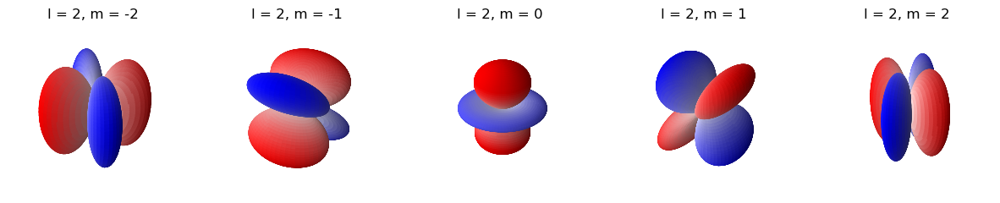

In [20]:
fig, axs = plt.subplots(1, y.shape[-1], subplot_kw={"projection": "3d"}, figsize=(y.shape[-1] * 3, 3))

for i, ax in enumerate(axs):
    yi = y[:, :, i]
    scale = float(yi.max() - yi.min())

    # Plot value of Harmonic as radius, colour by sign
    ax.plot_surface(
        jnp.abs(yi) * xss,
        jnp.abs(yi) * yss,
        jnp.abs(yi) * zss,
        rstride=1, cstride=1,
        facecolors=cm.bwr(yi / scale + 0.5)
    )
    _ = ax.set_box_aspect([1,1,1])
    #_ = ax.view_init(-135, 45)

    # Hide the grid
    ax.grid(False)
    ax.axis('off')

    # Label
    l = (y.shape[-1]  - 1) // 2
    _ = ax.set_title(f"l = {l}, m = {i - l}")